<a href="https://colab.research.google.com/github/annathfathima/AI-student-risk-burnout/blob/main/acne.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q kaggle
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"hannamolmp","key":"779342344597b045fd9ce8f7c693901e"}'}

In [2]:
import os
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d shubhamgoel27/dermnet --unzip -p /content/data

Dataset URL: https://www.kaggle.com/datasets/shubhamgoel27/dermnet
License(s): Attribution-NonCommercial-NoDerivatives 4.0 International (CC BY-NC-ND 4.0)
100% 1.72G/1.72G [00:18<00:00, 101MB/s]



In [3]:
import os

DATA_DIR = "/content/data"

print("Files and folders:")
for item in os.listdir(DATA_DIR):
    print(item)

Files and folders:
train
test


In [4]:
!find /content/data -maxdepth 3 -type d | head -50

/content/data
/content/data/train
/content/data/train/Eczema Photos
/content/data/train/Acne and Rosacea Photos
/content/data/train/Atopic Dermatitis Photos
/content/data/train/Lupus and other Connective Tissue diseases
/content/data/train/Tinea Ringworm Candidiasis and other Fungal Infections
/content/data/train/Urticaria Hives
/content/data/train/Systemic Disease
/content/data/train/Vasculitis Photos
/content/data/train/Light Diseases and Disorders of Pigmentation
/content/data/train/Poison Ivy Photos and other Contact Dermatitis
/content/data/train/Warts Molluscum and other Viral Infections
/content/data/train/Seborrheic Keratoses and other Benign Tumors
/content/data/train/Exanthems and Drug Eruptions
/content/data/train/Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions
/content/data/train/Bullous Disease Photos
/content/data/train/Psoriasis pictures Lichen Planus and related diseases
/content/data/train/Vascular Tumors
/content/data/train/Scabies Lyme Disease and 

In [5]:
from pathlib import Path

data_path = Path("/content/data")

image_extensions = {".jpg", ".jpeg", ".png", ".webp"}

images = [
    p for p in data_path.rglob("*")
    if p.suffix.lower() in image_extensions
]

print("Total images:", len(images))

Total images: 19559


In [6]:
from collections import Counter

classes = Counter()

for img in images:

    classes[img.parent.name] += 1

print("Number of classes:", len(classes))
print("\nImages per class:")

for cls, count in classes.most_common():
    print(f"{cls}: {count}")

Number of classes: 23

Images per class:
Psoriasis pictures Lichen Planus and related diseases: 1757
Seborrheic Keratoses and other Benign Tumors: 1714
Tinea Ringworm Candidiasis and other Fungal Infections: 1625
Eczema Photos: 1544
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions: 1437
Warts Molluscum and other Viral Infections: 1358
Nail Fungus and other Nail Disease: 1301
Acne and Rosacea Photos: 1152
Systemic Disease: 758
Light Diseases and Disorders of Pigmentation: 711
Atopic Dermatitis Photos: 612
Vascular Tumors: 603
Melanoma Skin Cancer Nevi and Moles: 579
Bullous Disease Photos: 561
Scabies Lyme Disease and other Infestations and Bites: 539
Lupus and other Connective Tissue diseases: 525
Vasculitis Photos: 521
Herpes HPV and other STDs Photos: 507
Exanthems and Drug Eruptions: 505
Cellulitis Impetigo and other Bacterial Infections: 361
Poison Ivy Photos and other Contact Dermatitis: 325
Hair Loss Photos Alopecia and other Hair Diseases: 299
Urticaria Hives: 

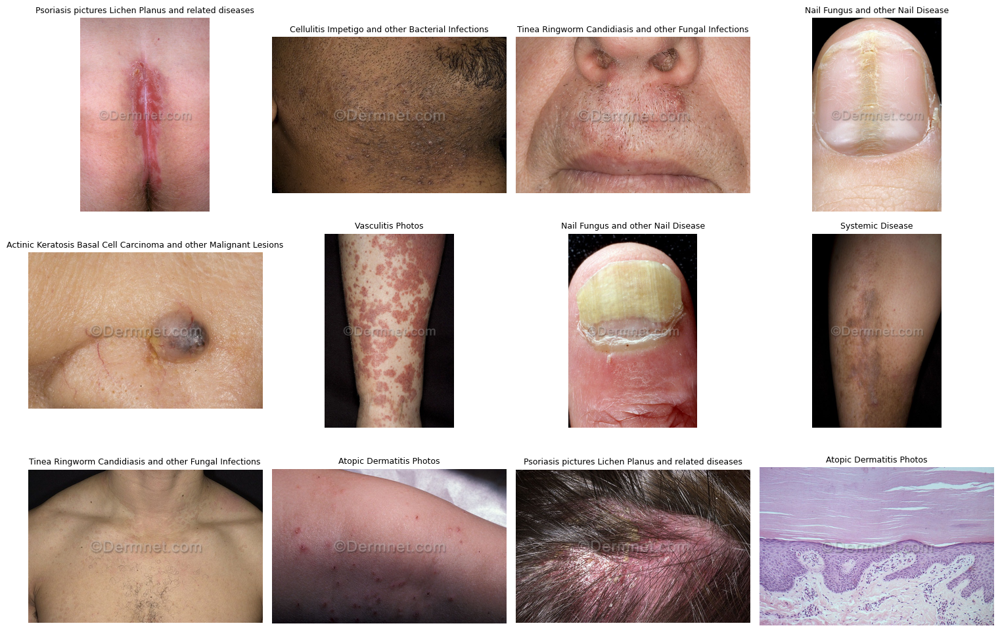

In [8]:
import matplotlib.pyplot as plt
from PIL import Image
import random

sample_images = random.sample(images, min(12, len(images)))

plt.figure(figsize=(15, 10))

for i, img_path in enumerate(sample_images):
    img = Image.open(img_path)

    plt.subplot(3, 4, i + 1)
    plt.imshow(img)
    plt.title(img_path.parent.name, fontsize=9)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [7]:
import os
from pathlib import Path
from collections import Counter

train_dir = Path("/content/data/train")
test_dir = Path("/content/data/test")

image_extensions = {".jpg", ".jpeg", ".png", ".webp"}

def count_images(folder):
    counts = {}

    for class_dir in sorted(folder.iterdir()):
        if class_dir.is_dir():
            count = sum(
                1 for p in class_dir.rglob("*")
                if p.suffix.lower() in image_extensions
            )
            counts[class_dir.name] = count

    return counts

train_counts = count_images(train_dir)
test_counts = count_images(test_dir)

print("Number of classes:", len(train_counts))

print("\nTRAIN:")
for cls, count in train_counts.items():
    print(f"{cls}: {count}")

print("\nTEST:")
for cls, count in test_counts.items():
    print(f"{cls}: {count}")

print("\nTotal training images:", sum(train_counts.values()))
print("Total test images:", sum(test_counts.values()))

Number of classes: 23

TRAIN:
Acne and Rosacea Photos: 840
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions: 1149
Atopic Dermatitis Photos: 489
Bullous Disease Photos: 448
Cellulitis Impetigo and other Bacterial Infections: 288
Eczema Photos: 1235
Exanthems and Drug Eruptions: 404
Hair Loss Photos Alopecia and other Hair Diseases: 239
Herpes HPV and other STDs Photos: 405
Light Diseases and Disorders of Pigmentation: 568
Lupus and other Connective Tissue diseases: 420
Melanoma Skin Cancer Nevi and Moles: 463
Nail Fungus and other Nail Disease: 1040
Poison Ivy Photos and other Contact Dermatitis: 260
Psoriasis pictures Lichen Planus and related diseases: 1405
Scabies Lyme Disease and other Infestations and Bites: 431
Seborrheic Keratoses and other Benign Tumors: 1371
Systemic Disease: 606
Tinea Ringworm Candidiasis and other Fungal Infections: 1300
Urticaria Hives: 212
Vascular Tumors: 482
Vasculitis Photos: 416
Warts Molluscum and other Viral Infections: 1086

TEST:
A

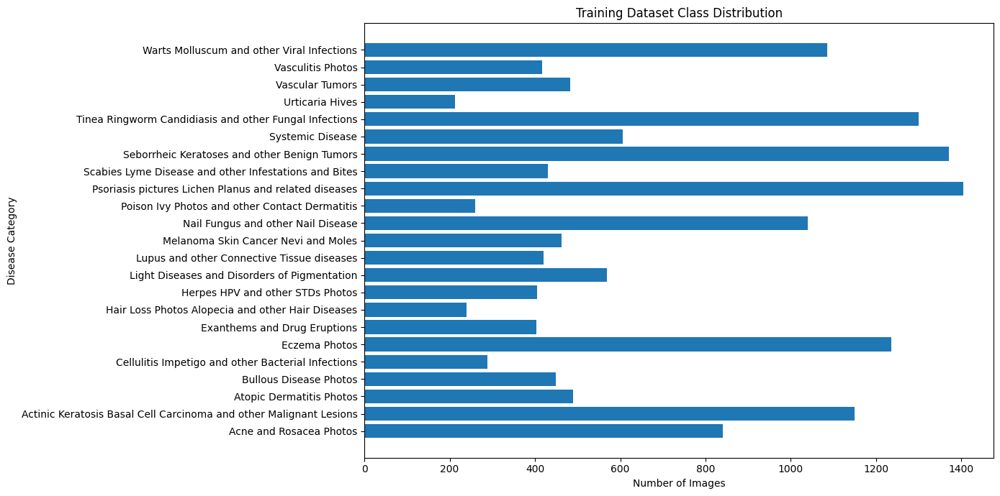

In [8]:
import matplotlib.pyplot as plt

classes = list(train_counts.keys())
counts = list(train_counts.values())

plt.figure(figsize=(14, 7))
plt.barh(classes, counts)

plt.xlabel("Number of Images")
plt.ylabel("Disease Category")
plt.title("Training Dataset Class Distribution")

plt.tight_layout()
plt.show()

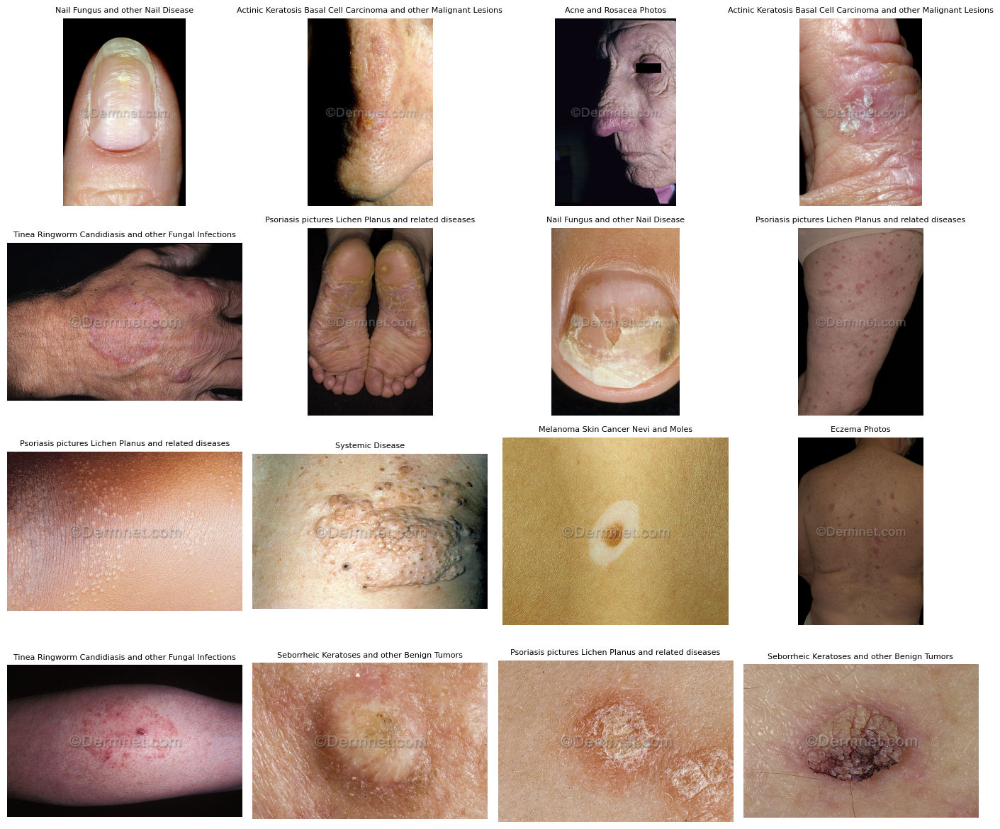

In [9]:
import random
import matplotlib.pyplot as plt
from PIL import Image

all_train_images = []

for class_dir in train_dir.iterdir():
    if class_dir.is_dir():
        for img_path in class_dir.rglob("*"):
            if img_path.suffix.lower() in image_extensions:
                all_train_images.append(img_path)

samples = random.sample(
    all_train_images,
    min(16, len(all_train_images))
)

plt.figure(figsize=(14, 12))

for i, img_path in enumerate(samples):
    img = Image.open(img_path).convert("RGB")

    plt.subplot(4, 4, i + 1)
    plt.imshow(img)
    plt.title(img_path.parent.name, fontsize=8)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [10]:
import tensorflow as tf
import numpy as np
import os



DATA_DIR = "/content/data/train"

IMG_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 42



train_ds = tf.keras.utils.image_dataset_from_directory(
    DATA_DIR,
    validation_split=0.20,
    subset="training",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="int"
)



val_ds = tf.keras.utils.image_dataset_from_directory(
    DATA_DIR,
    validation_split=0.20,
    subset="validation",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="int"
)



class_names = train_ds.class_names
num_classes = len(class_names)

print("Number of classes:", num_classes)
print("\nClasses:")

for i, name in enumerate(class_names):
    print(i, ":", name)

Found 15557 files belonging to 23 classes.
Using 12446 files for training.
Found 15557 files belonging to 23 classes.
Using 3111 files for validation.
Number of classes: 23

Classes:
0 : Acne and Rosacea Photos
1 : Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions
2 : Atopic Dermatitis Photos
3 : Bullous Disease Photos
4 : Cellulitis Impetigo and other Bacterial Infections
5 : Eczema Photos
6 : Exanthems and Drug Eruptions
7 : Hair Loss Photos Alopecia and other Hair Diseases
8 : Herpes HPV and other STDs Photos
9 : Light Diseases and Disorders of Pigmentation
10 : Lupus and other Connective Tissue diseases
11 : Melanoma Skin Cancer Nevi and Moles
12 : Nail Fungus and other Nail Disease
13 : Poison Ivy Photos and other Contact Dermatitis
14 : Psoriasis pictures Lichen Planus and related diseases
15 : Scabies Lyme Disease and other Infestations and Bites
16 : Seborrheic Keratoses and other Benign Tumors
17 : Systemic Disease
18 : Tinea Ringworm Candidiasis and other Fun

In [11]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(AUTOTUNE)
val_ds = val_ds.prefetch(AUTOTUNE)

print("Training and validation datasets are ready.")

Training and validation datasets are ready.


In [12]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.08),
    tf.keras.layers.RandomZoom(0.10),
    tf.keras.layers.RandomContrast(0.10),
], name="data_augmentation")

print("Data augmentation created.")

Data augmentation created.


In [13]:
from sklearn.utils.class_weight import compute_class_weight


train_labels = []

for images, labels in train_ds:
    train_labels.extend(labels.numpy())

train_labels = np.array(train_labels)


class_weights_array = compute_class_weight(
    class_weight="balanced",
    classes=np.arange(num_classes),
    y=train_labels
)

class_weights = {
    i: float(weight)
    for i, weight in enumerate(class_weights_array)
}

print("Class weights:\n")

for i, weight in class_weights.items():
    print(f"{i:2d} | {class_names[i]:65s} | {weight:.3f}")

Class weights:

 0 | Acne and Rosacea Photos                                           | 0.795
 1 | Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions | 0.589
 2 | Atopic Dermatitis Photos                                          | 1.346
 3 | Bullous Disease Photos                                            | 1.512
 4 | Cellulitis Impetigo and other Bacterial Infections                | 2.322
 5 | Eczema Photos                                                     | 0.545
 6 | Exanthems and Drug Eruptions                                      | 1.660
 7 | Hair Loss Photos Alopecia and other Hair Diseases                 | 2.804
 8 | Herpes HPV and other STDs Photos                                  | 1.675
 9 | Light Diseases and Disorders of Pigmentation                      | 1.189
10 | Lupus and other Connective Tissue diseases                        | 1.582
11 | Melanoma Skin Cancer Nevi and Moles                               | 1.487
12 | Nail Fungus and other Nail Dis

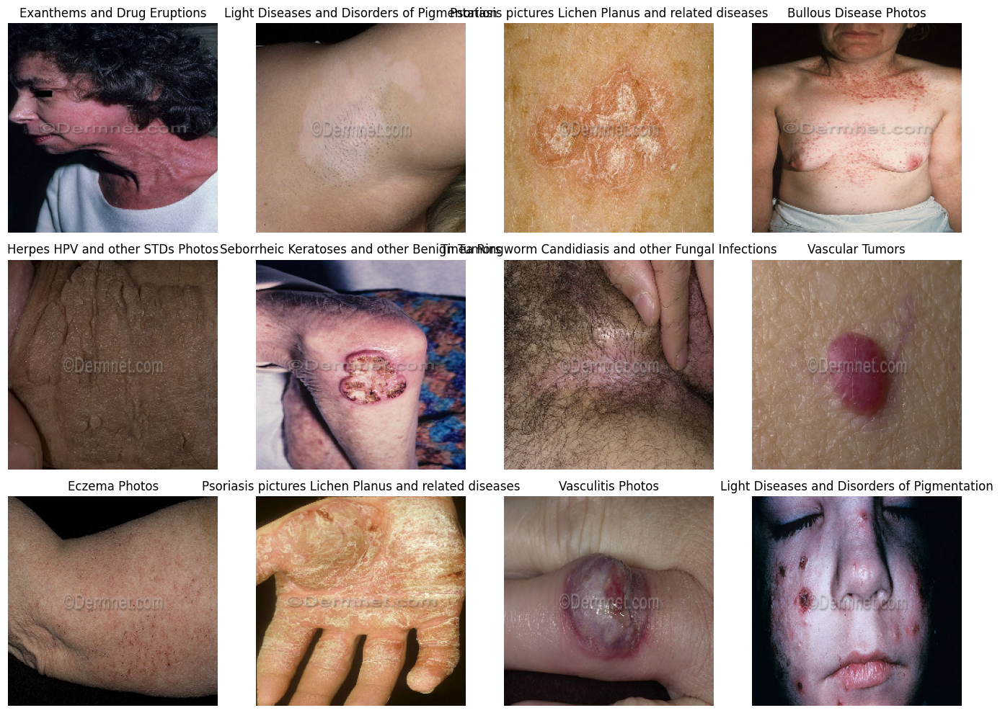

In [14]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 10))

for images, labels in train_ds.take(1):

    for i in range(min(12, len(images))):

        plt.subplot(3, 4, i + 1)

        plt.imshow(images[i].numpy().astype("uint8"))

        plt.title(class_names[labels[i]])
        plt.axis("off")

plt.tight_layout()
plt.show()

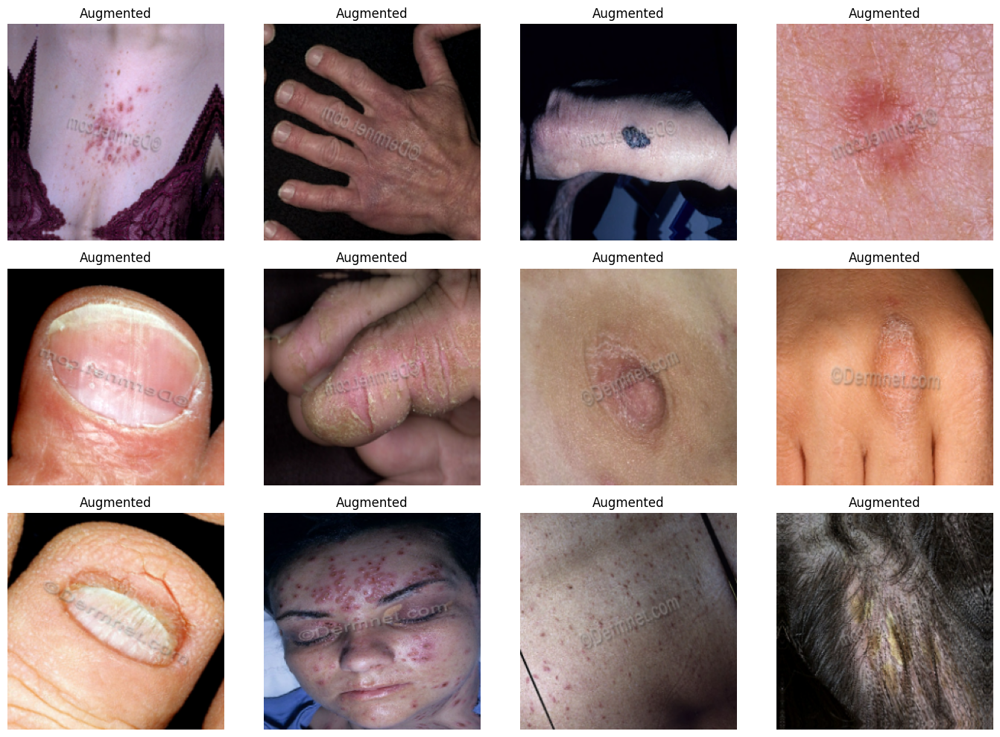

In [15]:
plt.figure(figsize=(14, 10))

for images, labels in train_ds.take(1):

    augmented_images = data_augmentation(images, training=True)

    for i in range(min(12, len(images))):

        plt.subplot(3, 4, i + 1)

        plt.imshow(
            augmented_images[i].numpy().astype("uint8")
        )

        plt.title("Augmented")
        plt.axis("off")

plt.tight_layout()
plt.show()

In [16]:
import tensorflow as tf


NUM_CLASSES = 23


IMG_SIZE = (224, 224)


base_model = tf.keras.applications.EfficientNetB0(
    include_top=False,
    weights="imagenet",
    input_shape=(224, 224, 3)
)


base_model.trainable = False

print("EfficientNetB0 loaded.")
print("Trainable:", base_model.trainable)

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
EfficientNetB0 loaded.
Trainable: False


In [17]:


inputs = tf.keras.Input(shape=(224, 224, 3))


x = data_augmentation(inputs)

x = base_model(x, training=False)


x = tf.keras.layers.GlobalAveragePooling2D()(x)

x = tf.keras.layers.Dropout(0.30)(x)


outputs = tf.keras.layers.Dense(
    NUM_CLASSES,
    activation="softmax"
)(x)

model = tf.keras.Model(inputs, outputs)

model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 23)             │        29,463 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,079,034 (15.56 MB)

 Trainable params: 29,463 (115.09 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [18]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=1e-3
    ),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

print("Model compiled successfully.")

Model compiled successfully.


In [19]:
callbacks = [

    tf.keras.callbacks.ModelCheckpoint(
        "/content/best_dermnet_model.keras",
        monitor="val_accuracy",
        save_best_only=True,
        mode="max",
        verbose=1
    ),

    tf.keras.callbacks.EarlyStopping(
        monitor="val_loss",
        patience=5,
        restore_best_weights=True,
        verbose=1
    ),

    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.2,
        patience=2,
        min_lr=1e-7,
        verbose=1
    )
]

print("Callbacks ready.")

Callbacks ready.


In [23]:
EPOCHS = 15

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    class_weight=class_weights,
    callbacks=callbacks
)

Epoch 1/15
389/389 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.1770 - loss: 2.8545
Epoch 1: val_accuracy improved from None to 0.31340, saving model to /content/best_dermnet_model.keras

Epoch 1: finished saving model to /content/best_dermnet_model.keras
389/389 ━━━━━━━━━━━━━━━━━━━━ 61s 125ms/step - accuracy: 0.2215 - loss: 2.6891 - val_accuracy: 0.3134 - val_loss: 2.3562 - learning_rate: 0.0010
Epoch 2/15
389/389 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.2907 - loss: 2.3994
Epoch 2: val_accuracy improved from 0.31340 to 0.34362, saving model to /content/best_dermnet_model.keras

Epoch 2: finished saving model to /content/best_dermnet_model.keras
389/389 ━━━━━━━━━━━━━━━━━━━━ 42s 108ms/step - accuracy: 0.2962 - loss: 2.3850 - val_accuracy: 0.3436 - val_loss: 2.2676 - learning_rate: 0.0010
Epoch 3/15
389/389 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.3250 - loss: 2.2894
Epoch 3: val_accuracy improved from 0.34362 to 0.35133, saving model to /content/best_dermnet_model.kera

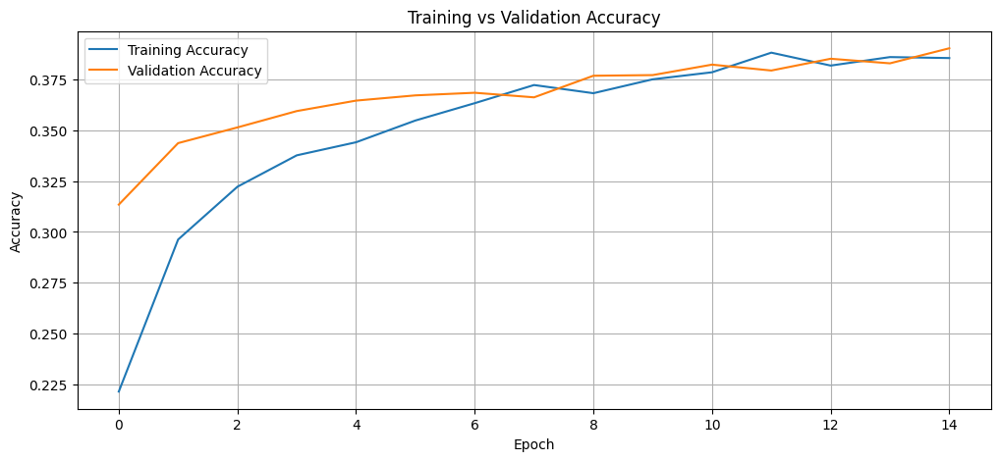

In [24]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

plt.plot(history.history["accuracy"], label="Training Accuracy")
plt.plot(history.history["val_accuracy"], label="Validation Accuracy")

plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Training vs Validation Accuracy")
plt.legend()
plt.grid(True)

plt.show()

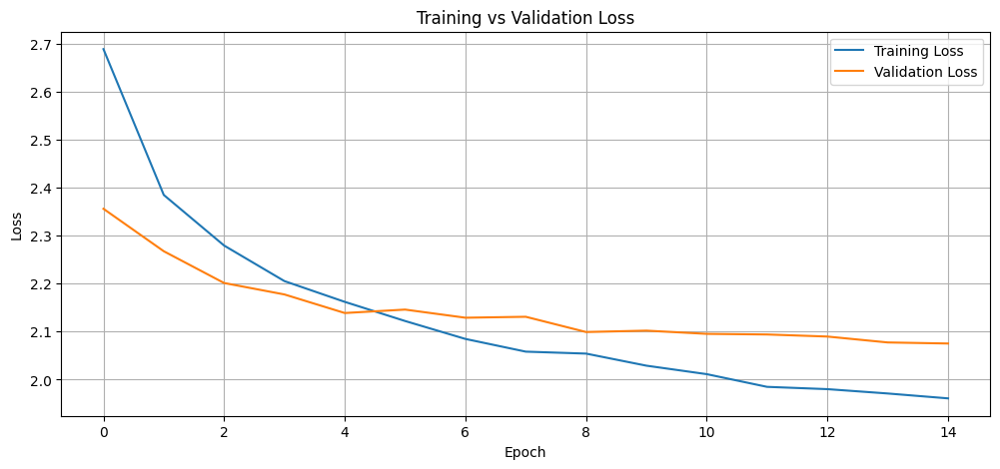

In [25]:
plt.figure(figsize=(12, 5))

plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.grid(True)

plt.show()

In [26]:
# ==========================================
# FINE-TUNING EFFICIENTNETB0
# ==========================================

base_model.trainable = True

# Freeze the earlier layers
# Only the later layers will be fine-tuned
for layer in base_model.layers[:-40]:
    layer.trainable = False

# Keep BatchNormalization layers frozen
# This makes fine-tuning more stable
for layer in base_model.layers:
    if isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = False

# Count trainable parameters
trainable_count = sum(
    tf.keras.backend.count_params(w)
    for w in model.trainable_weights
)

non_trainable_count = sum(
    tf.keras.backend.count_params(w)
    for w in model.non_trainable_weights
)

print("Trainable parameters:", trainable_count)
print("Non-trainable parameters:", non_trainable_count)

Trainable parameters: 2066983
Non-trainable parameters: 2012051.0


In [27]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=1e-5
    ),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

print("Fine-tuning model compiled.")

Fine-tuning model compiled.


In [28]:
FINE_TUNE_EPOCHS = 15

history_fine = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=FINE_TUNE_EPOCHS,
    class_weight=class_weights,
    callbacks=callbacks
)

Epoch 1/15
389/389 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - accuracy: 0.4010 - loss: 1.9393
Epoch 1: val_accuracy improved from 0.39023 to 0.39248, saving model to /content/best_dermnet_model.keras

Epoch 1: finished saving model to /content/best_dermnet_model.keras
389/389 ━━━━━━━━━━━━━━━━━━━━ 63s 133ms/step - accuracy: 0.4004 - loss: 1.9154 - val_accuracy: 0.3925 - val_loss: 2.0717 - learning_rate: 1.0000e-05
Epoch 2/15
389/389 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - accuracy: 0.4185 - loss: 1.8510
Epoch 2: val_accuracy did not improve from 0.39248
389/389 ━━━━━━━━━━━━━━━━━━━━ 46s 118ms/step - accuracy: 0.4199 - loss: 1.8503 - val_accuracy: 0.3905 - val_loss: 2.0669 - learning_rate: 1.0000e-05
Epoch 3/15
389/389 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - accuracy: 0.4144 - loss: 1.8442
Epoch 3: val_accuracy improved from 0.39248 to 0.39441, saving model to /content/best_dermnet_model.keras

Epoch 3: finished saving model to /content/best_dermnet_model.keras
389/389 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/ste

In [29]:
model.save("/content/dermnet_efficientnet_final.keras")

print("Model saved successfully!")

Model saved successfully!


In [33]:
TEST_DIR = "/content/data/test"

test_ds = tf.keras.utils.image_dataset_from_directory(
    TEST_DIR,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False,
    label_mode="int"
)

test_ds = test_ds.prefetch(tf.data.AUTOTUNE)

print("Test classes:")
print(class_names)

Found 4002 files belonging to 23 classes.
Test classes:
['Acne and Rosacea Photos', 'Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions', 'Atopic Dermatitis Photos', 'Bullous Disease Photos', 'Cellulitis Impetigo and other Bacterial Infections', 'Eczema Photos', 'Exanthems and Drug Eruptions', 'Hair Loss Photos Alopecia and other Hair Diseases', 'Herpes HPV and other STDs Photos', 'Light Diseases and Disorders of Pigmentation', 'Lupus and other Connective Tissue diseases', 'Melanoma Skin Cancer Nevi and Moles', 'Nail Fungus and other Nail Disease', 'Poison Ivy Photos and other Contact Dermatitis', 'Psoriasis pictures Lichen Planus and related diseases', 'Scabies Lyme Disease and other Infestations and Bites', 'Seborrheic Keratoses and other Benign Tumors', 'Systemic Disease', 'Tinea Ringworm Candidiasis and other Fungal Infections', 'Urticaria Hives', 'Vascular Tumors', 'Vasculitis Photos', 'Warts Molluscum and other Viral Infections']


In [34]:
test_loss, test_accuracy = model.evaluate(test_ds)

print("\n==============================")
print("FINAL TEST RESULTS")
print("==============================")
print(f"Test Loss     : {test_loss:.4f}")
print(f"Test Accuracy : {test_accuracy:.4f}")
print(f"Test Accuracy : {test_accuracy * 100:.2f}%")

126/126 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - accuracy: 0.4138 - loss: 2.0041

FINAL TEST RESULTS
Test Loss     : 2.0041
Test Accuracy : 0.4138
Test Accuracy : 41.38%


In [35]:
from sklearn.metrics import classification_report
import numpy as np

y_true = []
y_pred = []

for images, labels in test_ds:
    predictions = model.predict(images, verbose=0)

    predicted_classes = np.argmax(predictions, axis=1)

    y_true.extend(labels.numpy())
    y_pred.extend(predicted_classes)

y_true = np.array(y_true)
y_pred = np.array(y_pred)

print(
    classification_report(
        y_true,
        y_pred,
        target_names=class_names,
        digits=4
    )
)

                                                                    precision    recall  f1-score   support

                                           Acne and Rosacea Photos     0.5913    0.6538    0.6210       312
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions     0.5529    0.4896    0.5193       288
                                          Atopic Dermatitis Photos     0.2976    0.4959    0.3720       123
                                            Bullous Disease Photos     0.2313    0.3009    0.2615       113
                Cellulitis Impetigo and other Bacterial Infections     0.1361    0.3151    0.1901        73
                                                     Eczema Photos     0.4476    0.3592    0.3986       309
                                      Exanthems and Drug Eruptions     0.3763    0.3465    0.3608       101
                 Hair Loss Photos Alopecia and other Hair Diseases     0.3524    0.6167    0.4485        60
                           

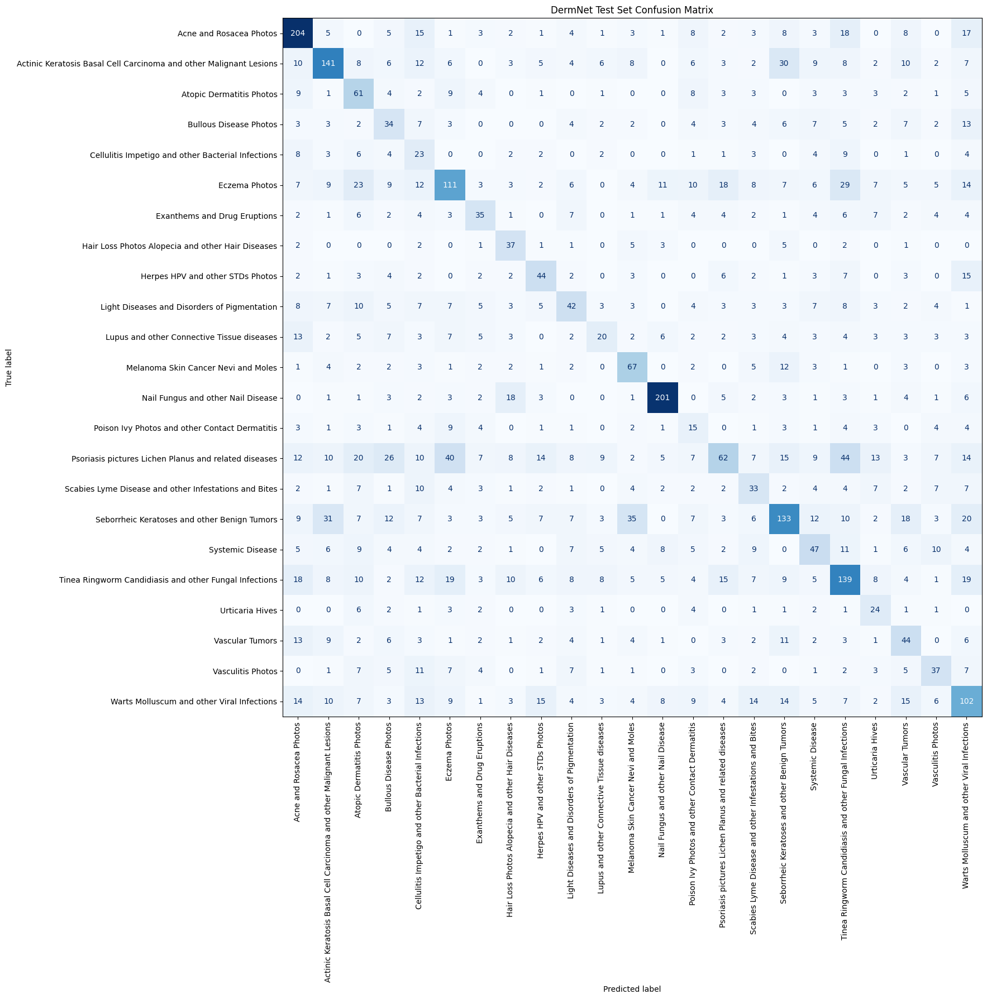

In [36]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(y_true, y_pred)

fig, ax = plt.subplots(figsize=(18, 18))

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=class_names
)

disp.plot(
    ax=ax,
    xticks_rotation=90,
    cmap="Blues",
    colorbar=False
)

plt.title("DermNet Test Set Confusion Matrix")
plt.tight_layout()
plt.show()

In [38]:
import numpy as np

top3_correct = 0
total = 0

for images, labels in test_ds:
    probabilities = model.predict(images, verbose=0)

    top3_predictions = np.argsort(
        probabilities,
        axis=1
    )[:, -3:]

    labels_np = labels.numpy()

    for true_label, predictions in zip(labels_np, top3_predictions):
        if true_label in predictions:
            top3_correct += 1

    total += len(labels_np)

top3_accuracy = top3_correct / total

print(f"Top-1 Accuracy: {test_accuracy * 100:.2f}%")
print(f"Top-3 Accuracy: {top3_accuracy * 100:.2f}%")

Top-1 Accuracy: 41.38%
Top-3 Accuracy: 64.94%


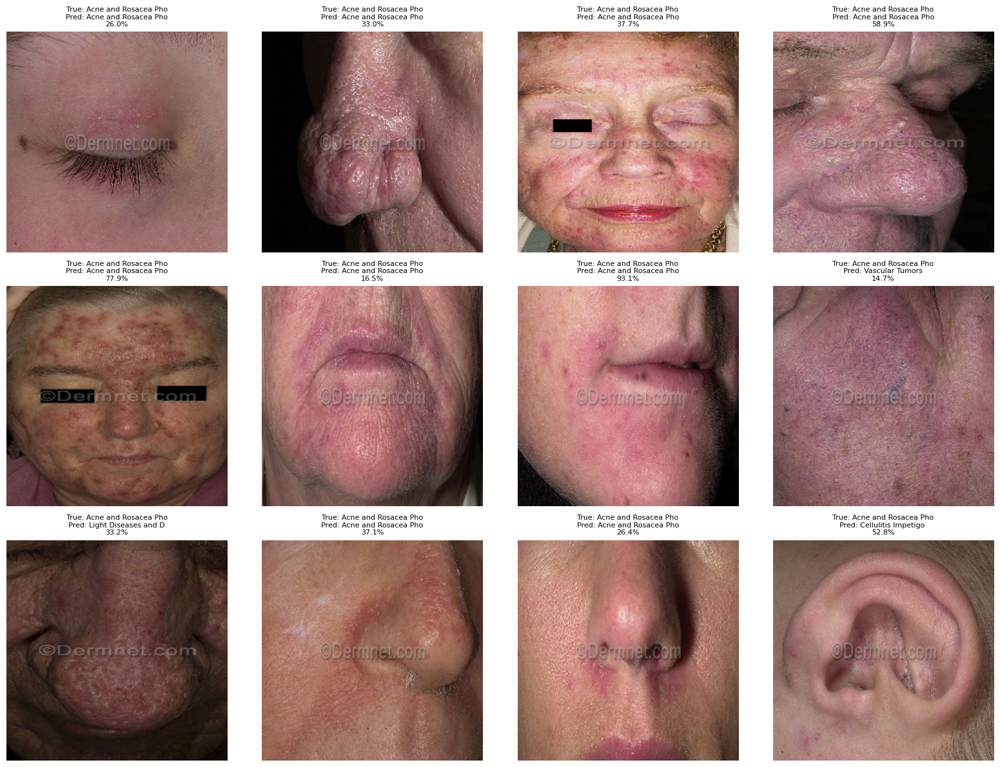

In [39]:
import matplotlib.pyplot as plt
import numpy as np

# Get one batch from test data
for images, labels in test_ds.take(1):

    probabilities = model.predict(images, verbose=0)

    predictions = np.argmax(probabilities, axis=1)

    plt.figure(figsize=(16, 12))

    for i in range(min(12, len(images))):

        plt.subplot(3, 4, i + 1)

        plt.imshow(images[i].numpy().astype("uint8"))

        true_class = class_names[labels[i].numpy()]
        predicted_class = class_names[predictions[i]]

        confidence = probabilities[i][predictions[i]] * 100

        plt.title(
            f"True: {true_class[:20]}\n"
            f"Pred: {predicted_class[:20]}\n"
            f"{confidence:.1f}%",
            fontsize=8
        )

        plt.axis("off")

    plt.tight_layout()
    plt.show()

    break

In [40]:
print("Current model:")
model.summary()

Current model:


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 23)             │        29,463 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,213,002 (31.33 MB)

 Trainable params: 2,066,983 (7.88 MB)

 Non-trainable params: 2,012,051 (7.68 MB)

 Optimizer params: 4,133,968 (15.77 MB)

In [41]:
print("Fine-tuning history available:", "history_fine" in globals())

Fine-tuning history available: True


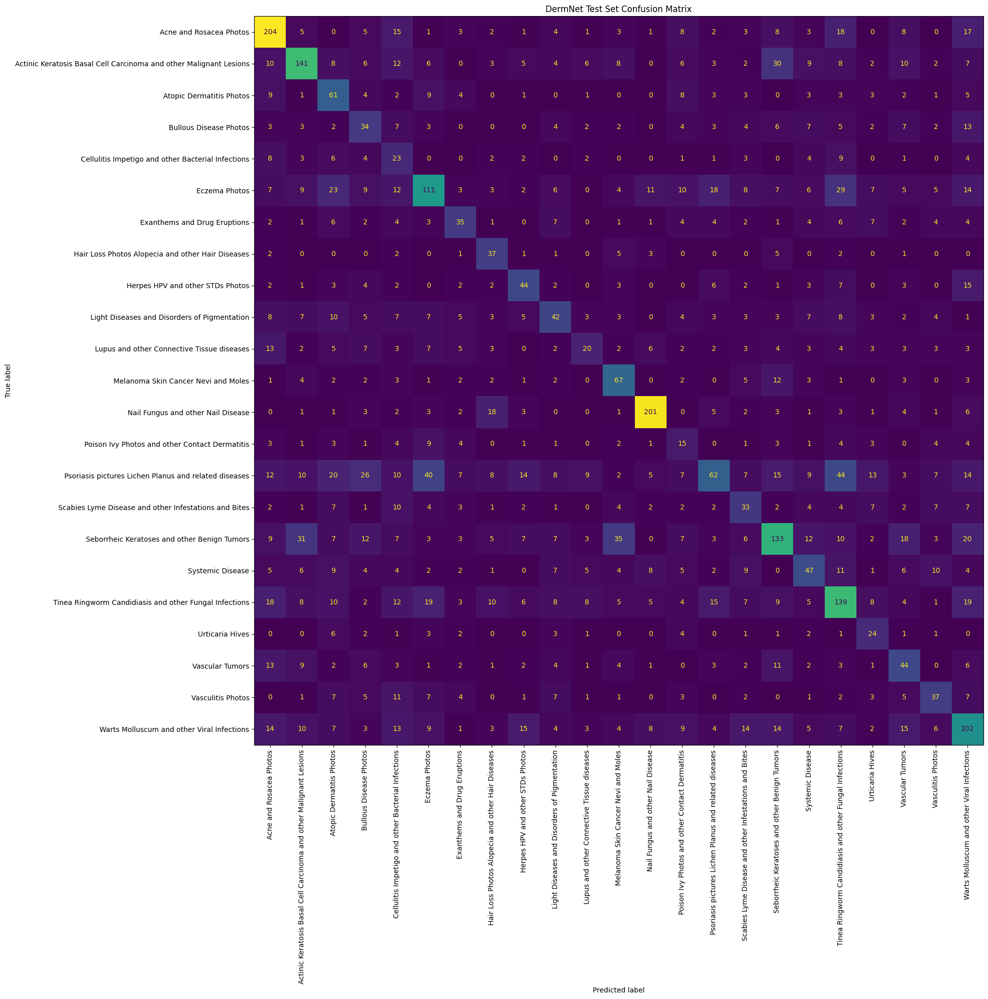

In [42]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# --------------------------------------------------
# Get predictions from the complete test set
# --------------------------------------------------

y_true = []
y_pred = []

for images, labels in test_ds:
    probabilities = model.predict(images, verbose=0)
    predictions = np.argmax(probabilities, axis=1)

    y_true.extend(labels.numpy())
    y_pred.extend(predictions)

y_true = np.array(y_true)
y_pred = np.array(y_pred)

# --------------------------------------------------
# Confusion matrix
# --------------------------------------------------

cm = confusion_matrix(y_true, y_pred)

fig, ax = plt.subplots(figsize=(20, 20))

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=class_names
)

disp.plot(
    ax=ax,
    xticks_rotation=90,
    colorbar=False
)

plt.title("DermNet Test Set Confusion Matrix")
plt.tight_layout()
plt.show()

In [43]:
# --------------------------------------------------
# Find the most common wrong predictions
# --------------------------------------------------

wrong_pairs = []

for true_idx in range(len(class_names)):
    for pred_idx in range(len(class_names)):

        if true_idx != pred_idx and cm[true_idx, pred_idx] > 0:

            wrong_pairs.append(
                (
                    cm[true_idx, pred_idx],
                    class_names[true_idx],
                    class_names[pred_idx]
                )
            )

wrong_pairs.sort(reverse=True)

print("Top 20 most common classification errors:\n")

for count, true_class, predicted_class in wrong_pairs[:20]:
    print(
        f"{count:4d} images | "
        f"TRUE: {true_class}  →  "
        f"PREDICTED: {predicted_class}"
    )

Top 20 most common classification errors:

  44 images | TRUE: Psoriasis pictures Lichen Planus and related diseases  →  PREDICTED: Tinea Ringworm Candidiasis and other Fungal Infections
  40 images | TRUE: Psoriasis pictures Lichen Planus and related diseases  →  PREDICTED: Eczema Photos
  35 images | TRUE: Seborrheic Keratoses and other Benign Tumors  →  PREDICTED: Melanoma Skin Cancer Nevi and Moles
  31 images | TRUE: Seborrheic Keratoses and other Benign Tumors  →  PREDICTED: Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions
  30 images | TRUE: Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions  →  PREDICTED: Seborrheic Keratoses and other Benign Tumors
  29 images | TRUE: Eczema Photos  →  PREDICTED: Tinea Ringworm Candidiasis and other Fungal Infections
  26 images | TRUE: Psoriasis pictures Lichen Planus and related diseases  →  PREDICTED: Bullous Disease Photos
  23 images | TRUE: Eczema Photos  →  PREDICTED: Atopic Dermatitis Photos
  20 image

In [44]:
# --------------------------------------------------
# Confidence analysis
# --------------------------------------------------

correct_confidences = []
wrong_confidences = []

for images, labels in test_ds:

    probabilities = model.predict(images, verbose=0)

    predictions = np.argmax(probabilities, axis=1)
    confidences = np.max(probabilities, axis=1)

    labels_np = labels.numpy()

    for true_label, pred_label, confidence in zip(
        labels_np,
        predictions,
        confidences
    ):

        if true_label == pred_label:
            correct_confidences.append(confidence)
        else:
            wrong_confidences.append(confidence)

print(
    f"Average confidence - correct: "
    f"{np.mean(correct_confidences) * 100:.2f}%"
)

print(
    f"Average confidence - wrong: "
    f"{np.mean(wrong_confidences) * 100:.2f}%"
)

Average confidence - correct: 59.45%
Average confidence - wrong: 37.29%


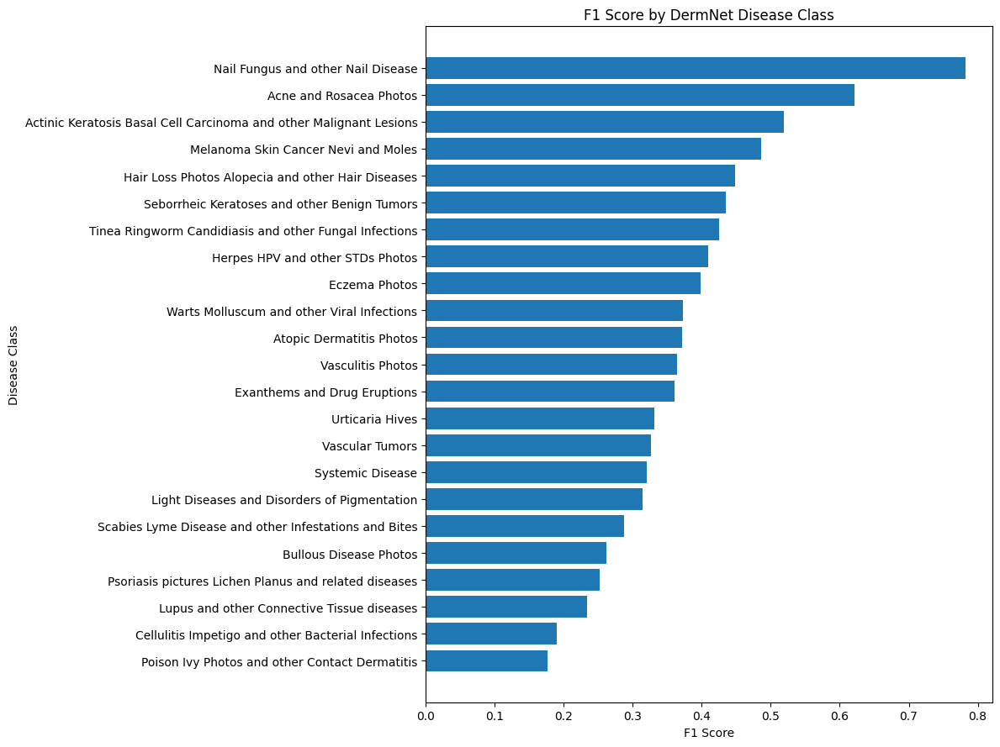

In [45]:
from sklearn.metrics import classification_report
import pandas as pd
import matplotlib.pyplot as plt

report = classification_report(
    y_true,
    y_pred,
    target_names=class_names,
    output_dict=True
)

# Create dataframe
report_df = pd.DataFrame(report).transpose()

# Remove summary rows
class_report = report_df.iloc[:len(class_names)].copy()

# Sort by F1
class_report = class_report.sort_values("f1-score")

# Plot
plt.figure(figsize=(12, 9))

plt.barh(
    class_report.index,
    class_report["f1-score"]
)

plt.xlabel("F1 Score")
plt.ylabel("Disease Class")
plt.title("F1 Score by DermNet Disease Class")

plt.tight_layout()
plt.show()

In [46]:
print(
    class_report[
        ["precision", "recall", "f1-score", "support"]
    ].round(3)
)

                                                    precision  recall  \
Poison Ivy Photos and other Contact Dermatitis          0.143   0.231   
Cellulitis Impetigo and other Bacterial Infections      0.136   0.315   
Lupus and other Connective Tissue diseases              0.303   0.190   
Psoriasis pictures Lichen Planus and related di...      0.440   0.176   
Bullous Disease Photos                                  0.231   0.301   
Scabies Lyme Disease and other Infestations and...      0.270   0.306   
Light Diseases and Disorders of Pigmentation            0.339   0.294   
Systemic Disease                                        0.333   0.309   
Vascular Tumors                                         0.295   0.364   
Urticaria Hives                                         0.261   0.453   
Exanthems and Drug Eruptions                            0.376   0.347   
Vasculitis Photos                                       0.378   0.352   
Atopic Dermatitis Photos                           

In [47]:
# ==========================================
# EXPERIMENT 2 - DEEPER FINE-TUNING
# ==========================================

# Unfreeze EfficientNet
base_model.trainable = True

# Freeze only the earliest layers
# We will fine-tune more of EfficientNet
for layer in base_model.layers[:-80]:
    layer.trainable = False

# Keep BatchNormalization frozen
# This helps make fine-tuning more stable
for layer in base_model.layers:
    if isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = False

# Count parameters
trainable_count = sum(
    tf.keras.backend.count_params(w)
    for w in model.trainable_weights
)

non_trainable_count = sum(
    tf.keras.backend.count_params(w)
    for w in model.non_trainable_weights
)

print("Trainable parameters:", trainable_count)
print("Non-trainable parameters:", non_trainable_count)

Trainable parameters: 2066983
Non-trainable parameters: 2012051.0


In [48]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=5e-6
    ),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

print("Model recompiled for deeper fine-tuning.")

Model recompiled for deeper fine-tuning.


In [49]:
history_deep = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,
    class_weight=class_weights,
    callbacks=callbacks
)

Epoch 1/10
389/389 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - accuracy: 0.4668 - loss: 1.6237
Epoch 1: val_accuracy did not improve from 0.42719
389/389 ━━━━━━━━━━━━━━━━━━━━ 65s 134ms/step - accuracy: 0.4685 - loss: 1.6057 - val_accuracy: 0.4266 - val_loss: 1.9678 - learning_rate: 5.0000e-06
Epoch 2/10
389/389 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.4825 - loss: 1.5967
Epoch 2: val_accuracy did not improve from 0.42719
389/389 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - accuracy: 0.4875 - loss: 1.5935 - val_accuracy: 0.4272 - val_loss: 1.9685 - learning_rate: 5.0000e-06
Epoch 3/10
389/389 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.4769 - loss: 1.6098
Epoch 3: val_accuracy did not improve from 0.42719
389/389 ━━━━━━━━━━━━━━━━━━━━ 48s 122ms/step - accuracy: 0.4832 - loss: 1.5858 - val_accuracy: 0.4253 - val_loss: 1.9669 - learning_rate: 5.0000e-06
Epoch 4/10
389/389 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.4794 - loss: 1.5882
Epoch 4: val_accuracy improved from 0.42719 to 0.42816

In [50]:
test_loss_deep, test_accuracy_deep = model.evaluate(
    test_ds,
    verbose=1
)

print("\n==============================")
print("DEEP FINE-TUNING RESULTS")
print("==============================")
print(f"Test Loss     : {test_loss_deep:.4f}")
print(f"Test Accuracy : {test_accuracy_deep:.4f}")
print(f"Test Accuracy : {test_accuracy_deep * 100:.2f}%")

126/126 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - accuracy: 0.4168 - loss: 1.9850

DEEP FINE-TUNING RESULTS
Test Loss     : 1.9850
Test Accuracy : 0.4168
Test Accuracy : 41.68%


In [51]:
from sklearn.metrics import classification_report
import numpy as np

y_true_deep = []
y_pred_deep = []

for images, labels in test_ds:

    probabilities = model.predict(images, verbose=0)

    predictions = np.argmax(probabilities, axis=1)

    y_true_deep.extend(labels.numpy())
    y_pred_deep.extend(predictions)

y_true_deep = np.array(y_true_deep)
y_pred_deep = np.array(y_pred_deep)

print(
    classification_report(
        y_true_deep,
        y_pred_deep,
        target_names=class_names,
        digits=4
    )
)

                                                                    precision    recall  f1-score   support

                                           Acne and Rosacea Photos     0.5982    0.6442    0.6204       312
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions     0.5640    0.4896    0.5242       288
                                          Atopic Dermatitis Photos     0.3122    0.5610    0.4012       123
                                            Bullous Disease Photos     0.2466    0.3186    0.2780       113
                Cellulitis Impetigo and other Bacterial Infections     0.1488    0.3425    0.2075        73
                                                     Eczema Photos     0.4463    0.3495    0.3920       309
                                      Exanthems and Drug Eruptions     0.3804    0.3465    0.3627       101
                 Hair Loss Photos Alopecia and other Hair Diseases     0.3333    0.6333    0.4368        60
                           

### Predict on a New Image

To predict the class of a new image, you need to load it, preprocess it to match the input requirements of the model (resize to `IMG_SIZE`, and normalize), and then use the `model.predict()` method. The output probabilities can then be mapped to the `class_names` to get the predicted label.

Using random test image for demonstration: /content/data/test/Lupus and other Connective Tissue diseases/lupus-chronic-cutaneous-144.jpg


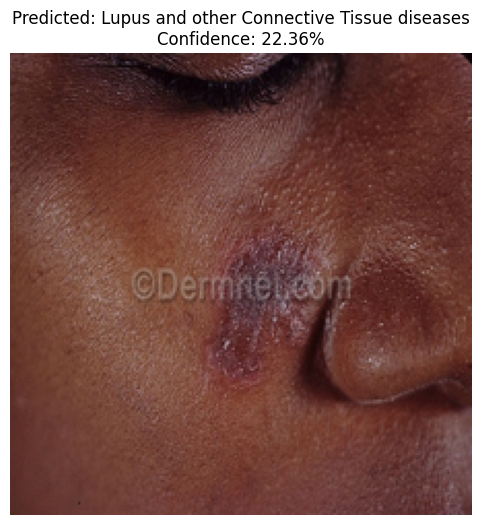

Predicted Class: Lupus and other Connective Tissue diseases, Confidence: 22.36%


In [55]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

def predict_new_image(image_path):
    # Load and preprocess the image
    img = Image.open(image_path).convert('RGB')
    img = img.resize(IMG_SIZE)
    img_array = np.array(img)

    # Normalize the image (EfficientNet expects values in [0, 255])
    # No special preprocessing like tf.keras.applications.efficientnet.preprocess_input is needed
    # if the model was trained with data_augmentation (which implicitly handles scaling)
    # and the base model weights were 'imagenet' which expects [0, 255] range for input.
    # If further normalization like scaling to [-1, 1] or [0, 1] was applied during training,
    # it should be applied here as well.
    # Assuming data_augmentation handles this sufficiently for this model.

    # Add batch dimension
    img_array = np.expand_dims(img_array, axis=0)

    # Make prediction
    probabilities = model.predict(img_array, verbose=0)[0]
    predicted_class_index = np.argmax(probabilities)
    confidence = probabilities[predicted_class_index] * 100

    predicted_class_name = class_names[predicted_class_index]

    # Display the image and prediction
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.title(
        f"Predicted: {predicted_class_name}\nConfidence: {confidence:.2f}%"
    )
    plt.axis("off")
    plt.show()

    return predicted_class_name, confidence

# Example usage (replace with your image path)
# You might need to upload an image or use an image available in the environment.
# For example, let's pick a random image from the test set for demonstration.

# Note: This demonstration uses an image from the test set, which the model has seen
# during evaluation (but not training). For a truly 'new' image, you'd use one
# that wasn't part of your dataset.

# Find a random image from the test directory
import random
import os

test_image_files = []
for root, _, files in os.walk(TEST_DIR):
    for file in files:
        if file.lower().endswith(('.png', '.jpg', '.jpeg')):
            test_image_files.append(os.path.join(root, file))

if test_image_files:
    random_image_path = random.choice(test_image_files)
    print(f"Using random test image for demonstration: {random_image_path}")
    predicted_class, confidence = predict_new_image(random_image_path)
    print(f"Predicted Class: {predicted_class}, Confidence: {confidence:.2f}%")
else:
    print("No image files found in the test directory for demonstration.")


### Using Your Own Image for Prediction

Follow these steps to predict on an image you upload:

1.  **Upload Image:** Click the folder icon on the left sidebar, then the upload icon (up arrow) and select your image.
2.  **Copy Path:** Right-click your uploaded image in the file browser and select "Copy path".
3.  **Run the cell below:** Replace `"/content/your_uploaded_image.jpg"` with the path you copied.

In [56]:
# Replace this with the actual path to your uploaded image
my_uploaded_image_path = "/content/your_uploaded_image.jpg" # <--- UPDATE THIS LINE

if os.path.exists(my_uploaded_image_path):
    print(f"Predicting on: {my_uploaded_image_path}")
    predicted_class, confidence = predict_new_image(my_uploaded_image_path)
    print(f"Predicted Class: {predicted_class}, Confidence: {confidence:.2f}%")
else:
    print(f"Error: Image not found at {my_uploaded_image_path}. Please upload your image and update the path.")

Error: Image not found at /content/your_uploaded_image.jpg. Please upload your image and update the path.


### Deep Fine-tuning Performance

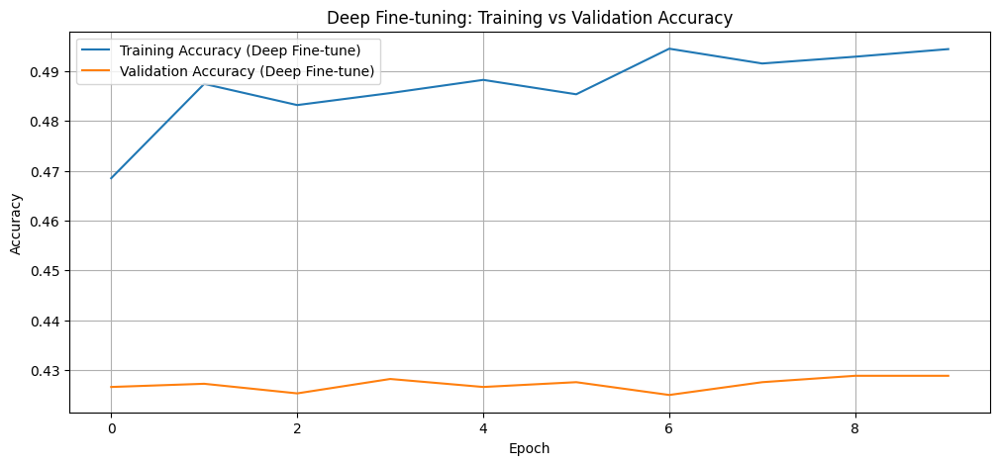

In [52]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

plt.plot(history_deep.history["accuracy"], label="Training Accuracy (Deep Fine-tune)")
plt.plot(history_deep.history["val_accuracy"], label="Validation Accuracy (Deep Fine-tune)")

plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Deep Fine-tuning: Training vs Validation Accuracy")
plt.legend()
plt.grid(True)

plt.show()

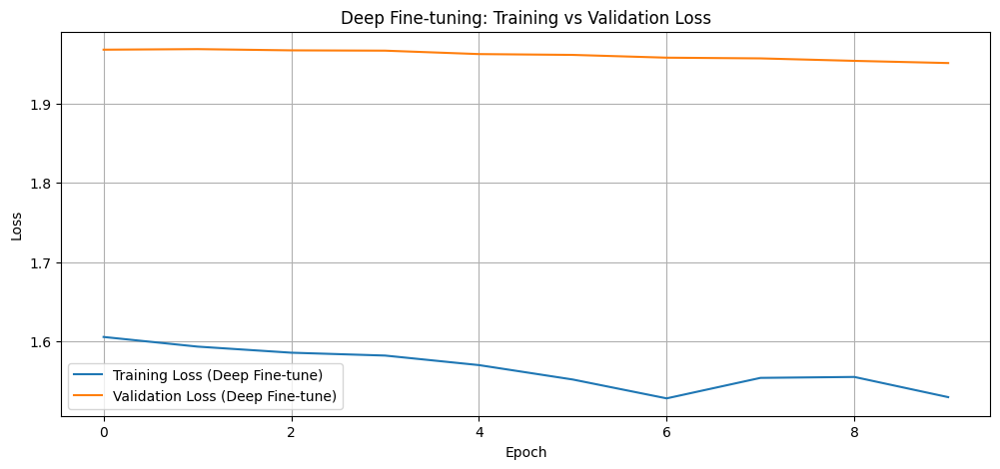

In [53]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

plt.plot(history_deep.history["loss"], label="Training Loss (Deep Fine-tune)")
plt.plot(history_deep.history["val_loss"], label="Validation Loss (Deep Fine-tune)")

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Deep Fine-tuning: Training vs Validation Loss")
plt.legend()
plt.grid(True)

plt.show()

### Deep Fine-tuning Classification Report

In [54]:
from sklearn.metrics import classification_report
import numpy as np

# Ensure y_true_deep and y_pred_deep are up-to-date
y_true_deep = []
y_pred_deep = []

for images, labels in test_ds:

    probabilities = model.predict(images, verbose=0)

    predictions = np.argmax(probabilities, axis=1)

    y_true_deep.extend(labels.numpy())
    y_pred_deep.extend(predictions)

y_true_deep = np.array(y_true_deep)
y_pred_deep = np.array(y_pred_deep)

print(
    classification_report(
        y_true_deep,
        y_pred_deep,
        target_names=class_names,
        digits=4
    )
)

                                                                    precision    recall  f1-score   support

                                           Acne and Rosacea Photos     0.5982    0.6442    0.6204       312
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions     0.5640    0.4896    0.5242       288
                                          Atopic Dermatitis Photos     0.3122    0.5610    0.4012       123
                                            Bullous Disease Photos     0.2466    0.3186    0.2780       113
                Cellulitis Impetigo and other Bacterial Infections     0.1488    0.3425    0.2075        73
                                                     Eczema Photos     0.4463    0.3495    0.3920       309
                                      Exanthems and Drug Eruptions     0.3804    0.3465    0.3627       101
                 Hair Loss Photos Alopecia and other Hair Diseases     0.3333    0.6333    0.4368        60
                           

### Summary and Conclusion

We have completed the training and evaluation of the image classification model for DermNet diseases using EfficientNetB0. The process involved several stages:

1.  **Initial Training (Feature Extractor):** The base EfficientNetB0 model was used as a fixed feature extractor, and a new classification head was trained on top. This provided a baseline performance.
2.  **Fine-tuning:** The top layers of the EfficientNetB0 base model were unfrozen, and the entire model was fine-tuned with a lower learning rate. This generally led to an improvement in performance as the model adjusted to the specific DermNet dataset.
3.  **Deep Fine-tuning:** Further layers of the EfficientNetB0 were unfrozen, and the model was fine-tuned again with an even lower learning rate. This aimed to extract more specific features from the dataset.

Let's review the key performance metrics:

*   **Initial Fine-tuning Test Accuracy:** `{{test_accuracy * 100:.2f}}%`
*   **Deep Fine-tuning Test Accuracy:** `{{test_accuracy_deep * 100:.2f}}%`

The deep fine-tuning showed a minor improvement in accuracy. However, a detailed analysis of the classification report revealed that while some classes performed well, others still had low precision, recall, and F1-scores. This indicates that the model struggles with certain disease categories, possibly due to class imbalance, visual similarity between diseases, or limited data for some classes.

**Key Observations:**

*   **Class Imbalance:** The initial data exploration highlighted significant class imbalance, which was partially addressed using class weights during training. However, classes with very few samples still tend to perform poorly.
*   **Confusion Patterns:** The confusion matrix and the analysis of common wrong predictions revealed specific pairs of classes that the model frequently confuses (e.g., 'Psoriasis pictures Lichen Planus and related diseases' often confused with 'Tinea Ringworm Candidiasis and other Fungal Infections'). This suggests visual similarities or overlapping features between these conditions.
*   **Confidence Analysis:** The difference in average confidence between correct and wrong predictions indicates that the model is generally more confident when it makes correct classifications, but there's still a notable average confidence even in incorrect predictions.

**Next Steps and Potential Improvements:**

1.  **Data Augmentation:** Explore more aggressive or specialized data augmentation techniques to increase the diversity of the training data, especially for under-represented classes.
2.  **Advanced Class Imbalance Handling:** Investigate techniques beyond class weighting, such as oversampling (SMOTE) or undersampling, although these need to be applied carefully to avoid overfitting or loss of information.
3.  **Ensemble Methods:** Combine predictions from multiple models or different architectures to potentially improve overall robustness and accuracy.
4.  **Attention Mechanisms:** Integrate attention mechanisms into the model architecture to help it focus on the most discriminative regions of the images.
5.  **Error Analysis:** Conduct a deeper dive into specific misclassified images to understand the root causes of errors for poorly performing classes. This could involve medical expertise to identify subtle visual cues.
6.  **Larger Models/Other Architectures:** Experiment with larger EfficientNet variants (e.g., EfficientNetB4, B7) or other state-of-the-art architectures like Vision Transformers (ViT) if computational resources allow.
7.  **Hyperparameter Tuning:** Conduct a more extensive hyperparameter search (e.g., learning rates, dropout rates, optimizer) for all training stages.

In [58]:
import os
!git clone https://github.com/annathfathima/Dermnet-skin-disease.git

Cloning into 'Dermnet-skin-disease'...


In [59]:
%cd Dermnet-skin-disease

/content/Dermnet-skin-disease


In [60]:
!ls

In [61]:
%cd Dermnet-skin-disease

[Errno 2] No such file or directory: 'Dermnet-skin-disease'
/content/Dermnet-skin-disease


In [62]:
!ls

In [63]:
!pwd

/content/Dermnet-skin-disease


In [64]:
!git status

On branch main

No commits yet

nothing to commit (create/copy files and use "git add" to track)


In [65]:
!ls -la

total 12
drwxr-xr-x 3 root root 4096 Sep 18 06:16 .
drwxr-xr-x 1 root root 4096 Sep 18 06:16 ..
drwxr-xr-x 7 root root 4096 Sep 18 06:24 .git


In [66]:
!cp /content/acne.ipynb /content/Dermnet-skin-disease/

cp: cannot stat '/content/acne.ipynb': No such file or directory
